In [5]:
# import libraries
# !pip install folium --upgrade

from numpy.random import *
import pandas as pd
# from geopandas import *
import numpy as np
from collections import Counter
import matplotlib.pyplot as plt
%matplotlib inline
import folium
import json
import os
from branca.colormap import linear
import branca.colormap
# import geopandas as gpd
from collections import defaultdict
import webbrowser
import seaborn

import folium.plugins # The Folium Javascript Map Library
from folium.plugins import HeatMap
from folium.plugins import HeatMapWithTime
from folium import Choropleth
from folium.map import *

# from IPython.core.interactiveshell import InteractiveShell
# InteractiveShell.ast_node_interactivity = "all"

# DATA PREPARATION

In [2]:
berkeley_tracts2 = os.path.join('Census Tract Polygons 2010 (With Incom+Race+Numstops+Numschools Data).geojson')
geo_json_data2 = json.load(open(berkeley_tracts2))


stops_data = os.path.join('formatted_allstops.csv')
df = pd.read_csv('for graphs.csv')

/opt/conda/lib/python3.9/site-packages/IPython/core/interactiveshell.py:3369: DtypeWarning: Columns (23,24,54) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [3]:
df.head()
df.columns.values
df['date_of_stop'] = pd.to_datetime(df['date_of_stop'])
df['result_of_stoptype'].unique()

array(['Citation for Infraction', 'Custodial Arrest With Warrant',
       'Warning', 'Noncriminal Transport',
       'Custodial Arrest Without Warrant', 'No Action',
       'In-Field Cite and Release', 'Psychiatric Hold',
       'Field Interview Card', 'Other', 'Contacted Guardians'],
      dtype=object)

In [4]:
types_grouped = df.groupby('result_of_stoptype',as_index=False).count()
# country_counts = countries.groupby('continent', as_index=False).agg('count')
types_grouped = types_grouped[['result_of_stoptype','v1']].rename(columns={'v1':'count'})
types_grouped.sort_values(by='count', ascending=False, inplace=True, ignore_index=True)
types_grouped

,result_of_stoptype,count
0,Warning,34541
1,Citation for Infraction,20833
2,Other,3033
3,No Action,1324
4,Custodial Arrest Without Warrant,787
5,Psychiatric Hold,389
6,Custodial Arrest With Warrant,317
7,In-Field Cite and Release,291
8,Noncriminal Transport,95
9,Field Interview Card,88


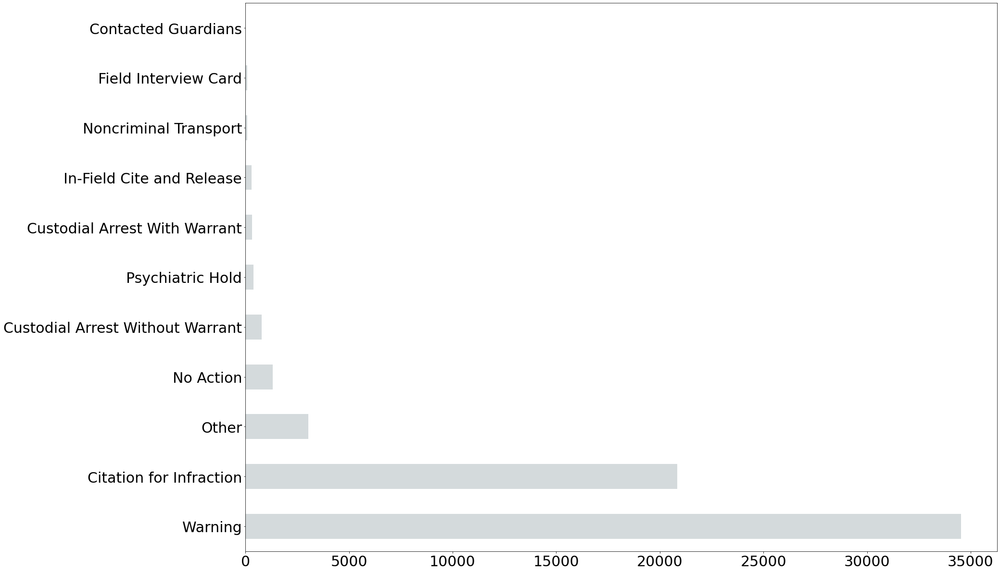

In [5]:
plt.rc('font', size=30)

types_grouped_chart = types_grouped.plot.barh(x='result_of_stoptype', y='count', color='#D4DADC', legend=False)
types_grouped_chart.yaxis.set_label_text("")
figure = plt.gcf()
figure.set_size_inches(28, 21)
plt.savefig('Stop Types Grouped.png')
plt.show()

In [6]:
round(sum(types_grouped.loc[[4,6],'count'].values)/sum(types_grouped.loc[[0,1,2,3,5,7,8,9,10],'count'].values),2)


0.02

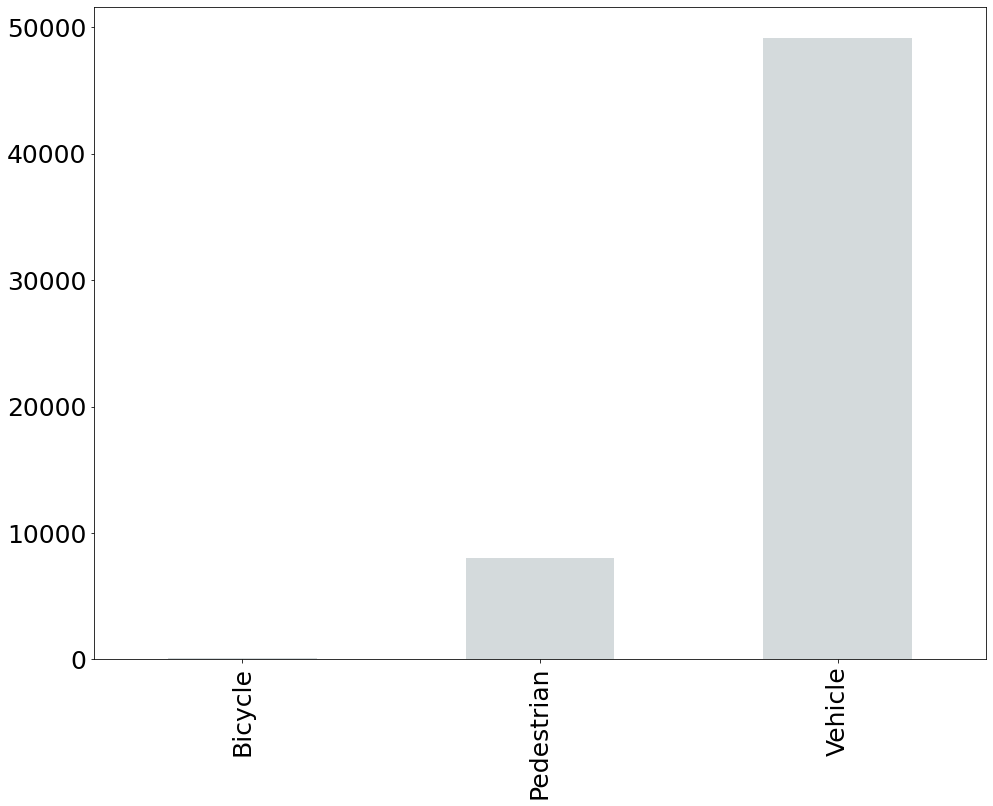

In [7]:
plt.rc('font', size=25)
stop_data = {'Stop Type':['Vehicle', 'Pedestrian', 'Bicycle'],
             'count':[49152, 8000, 141]}


stops_grouped = pd.DataFrame(stop_data)
stops_grouped.sort_values(by='count', ascending=True, inplace=True)
stops_grouped

stops_grouped_chart = stops_grouped.plot.bar(x='Stop Type', y='count', color='#D4DADC', legend=False)
stops_grouped_chart.xaxis.set_label_text("")
figure = plt.gcf()
figure.set_size_inches(16, 12)
plt.savefig('Vehicle Bike Pedestrian Grouped.png')
plt.show()

findfont: Font family ['roboto mono'] not found. Falling back to DejaVu Sans.


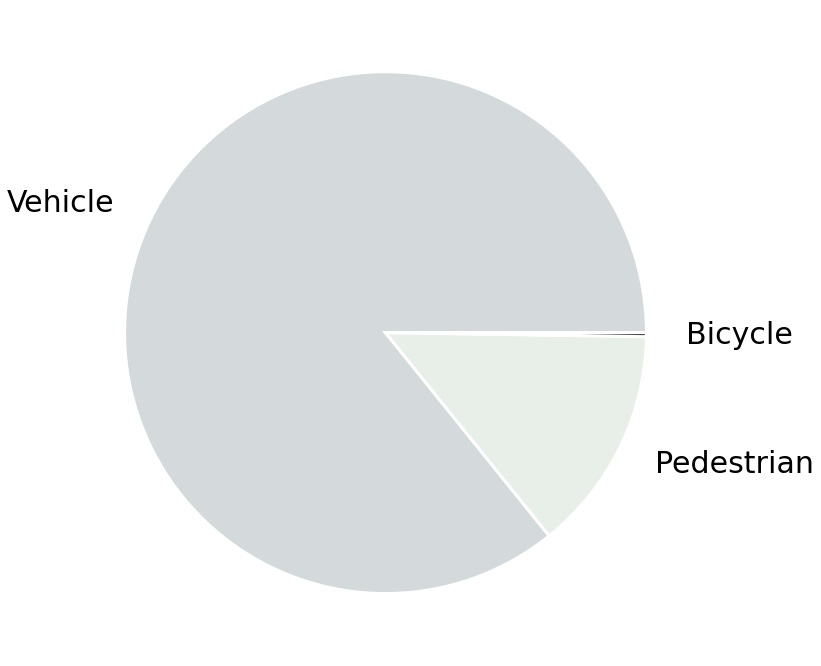

In [8]:
# library
import matplotlib.pyplot as plt

font = {'family' : 'roboto mono',
        'weight' : 'normal',
        'size'   : 30}

plt.rc('font', **font)
 
# create data
names = 'Vehicle', 'Pedestrian', 'Bicycle'
values = [49152, 8000, 141]
colors= ['#D4DADC', '#E7EFE8', '#2F2F2F']


# Label distance: gives the space between labels and the center of the pie
plt.pie(values, labels=names, labeldistance=1.15, wedgeprops = { 'linewidth' : 3, 'edgecolor' : 'white' }, colors=colors);
plt.yticks(fontsize=30,fontname='roboto mono')
figure = plt.gcf()
figure.set_size_inches(16, 12)
# plt.xticks(xticks_pos, labels,  ha='right', fontsize=30, fontname='roboto mono')
plt.savefig('Types of Stops (BAR)')
plt.show()

findfont: Font family ['roboto mono'] not found. Falling back to DejaVu Sans.


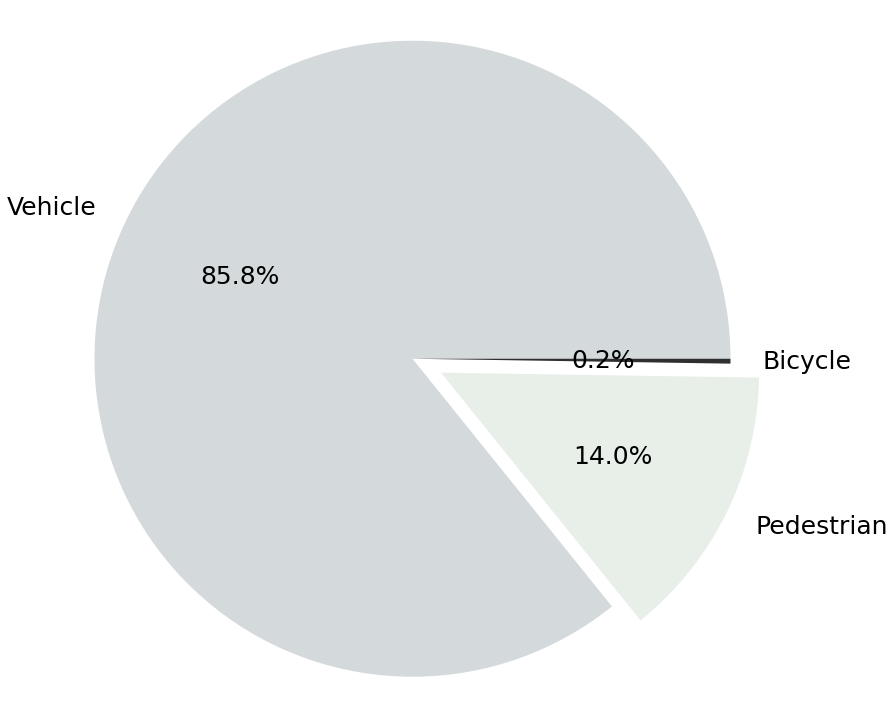

In [9]:
plt.rc('font', size=25)


# Pie chart
labels = ['Vehicle', 'Pedestrian', 'Bicycle']
sizes = [49152, 8000, 141]

# only "explode" the 2nd slice (i.e. 'traffic')

explode = (0, 0.1, 0)  
fig1, ax1 = plt.subplots()


ax1.pie(sizes, explode=explode, labels=labels, autopct='%1.1f%%',colors=colors)
# ax1.pie(sizes, explode=explode, colors=colors) #no text version

# Equal aspect ratio ensures that pie is drawn as a circle
ax1.axis('equal')  
plt.tight_layout()

figure = plt.gcf()
figure.set_size_inches(16, 12)
plt.savefig('Types of Stops (BAR) (DETAILED)')
plt.show()

In [10]:
berk_data = pd.read_csv('formatted_allstops_large(expanded) (2).csv')
berk_data = berk_data[['censustract','perceived_race_or_ethnicity']]

/opt/conda/lib/python3.9/site-packages/IPython/core/interactiveshell.py:3369: DtypeWarning: Columns (23,24,54) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [11]:
%%time

import warnings
warnings.filterwarnings("ignore")

berk_data.perceived_race_or_ethnicity[berk_data.perceived_race_or_ethnicity == 'White'] = 2
berk_data.perceived_race_or_ethnicity[berk_data.perceived_race_or_ethnicity == 'Black/African American'] = 3
berk_data.perceived_race_or_ethnicity[berk_data.perceived_race_or_ethnicity ==  'Black'] = 3
berk_data.perceived_race_or_ethnicity[berk_data.perceived_race_or_ethnicity=="Hispanic/Latino"] = 4 
berk_data.perceived_race_or_ethnicity[berk_data.perceived_race_or_ethnicity=="Hispanic"] = 4
berk_data.perceived_race_or_ethnicity[berk_data.perceived_race_or_ethnicity == 'Asian'] = 5

for i in range(df.index.size):
    if berk_data.loc[i,'perceived_race_or_ethnicity'] in (2,3,4,5):
        continue
    else:
        berk_data.loc[i,'perceived_race_or_ethnicity'] = 1

berk_data.perceived_race_or_ethnicity[berk_data.perceived_race_or_ethnicity == 1] = 'Mixed'
berk_data.perceived_race_or_ethnicity[berk_data.perceived_race_or_ethnicity == 2] = 'White'
berk_data.perceived_race_or_ethnicity[berk_data.perceived_race_or_ethnicity == 3] = 'Black'
berk_data.perceived_race_or_ethnicity[berk_data.perceived_race_or_ethnicity== 4] = 'Hispanic'
berk_data.perceived_race_or_ethnicity[berk_data.perceived_race_or_ethnicity == 5] = 'Asian'

CPU times: user 6.75 s, sys: 5.53 ms, total: 6.76 s
Wall time: 6.76 s


In [12]:
# Force display of all values 
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
 

In [13]:
races_grouped = berk_data.groupby(['perceived_race_or_ethnicity'], as_index=False).size() \
                         .rename(columns={'perceived_race_or_ethnicity':'Race', 'size':'Count'}) \
                         .sort_values(by='Count', ascending=False, ignore_index=True)
races_grouped['Percent of Arrests'] = round(races_grouped['Count']/61702,2)

berk_total_pop = 114343
white_percent = round(69828/berk_total_pop,2)
black_percent = round(9296/berk_total_pop,2)
hispanic_percent = round(10000/berk_total_pop,2)
asian_percent = round(24390/berk_total_pop,2)
mixed_percent = round(7586/berk_total_pop,2)

race_pop_prop = [white_percent,black_percent,hispanic_percent,mixed_percent,asian_percent]
races_grouped['Percent of Residential Population'] = race_pop_prop
races_grouped.loc[1,'Race'] = 'Black'
races_grouped.loc[2,'Race'] = 'Hispanic'
races_grouped

,Race,Count,Percent of Arrests,Percent of Residential Population
0,White,21929,0.36,0.61
1,Black,20494,0.33,0.08
2,Hispanic,8156,0.13,0.09
3,Mixed,6364,0.10,0.07
4,Asian,4759,0.08,0.21


Text(0.5, 0, '')

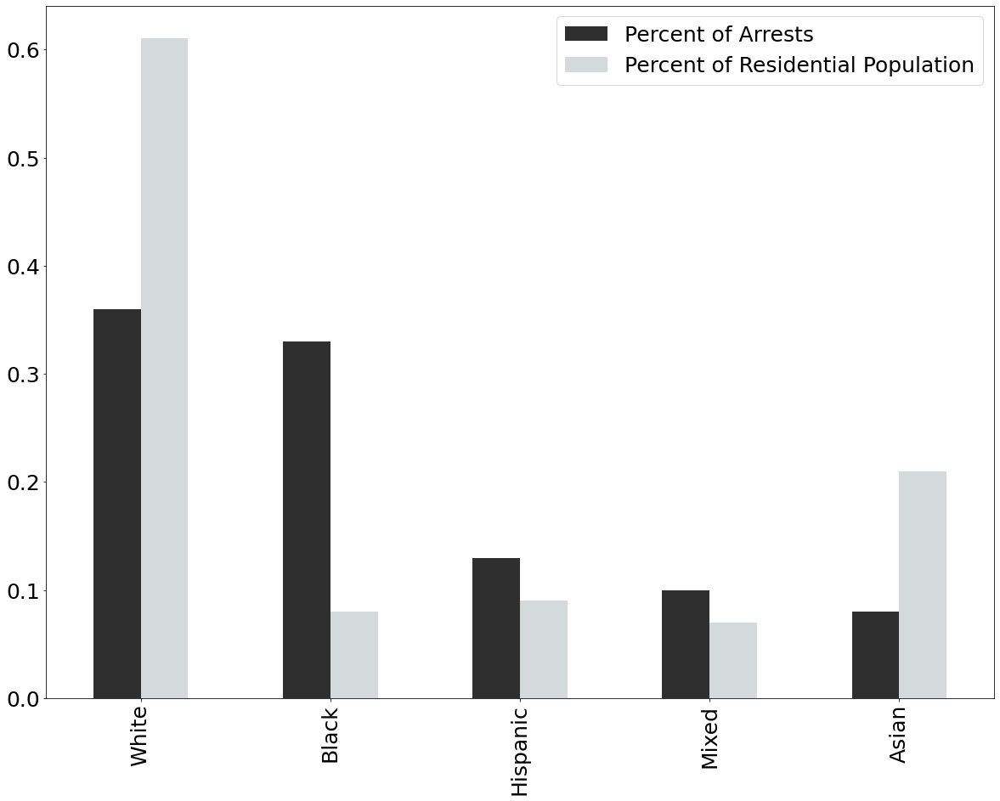

In [14]:
# colors= ['#D4DADC', '#E7EFE8', '#2F2F2F']
plt.rc('font', size=25)

stops_grouped_chart = races_grouped.plot.bar(x='Race', y=['Percent of Arrests', 'Percent of Residential Population'], 
                                             legend=True, color=['#2F2F2F','#D4DADC'])
stops_grouped_chart.xaxis.set_label_text("")
figure = plt.gcf()
figure.set_size_inches(20, 15)
plt.savefig('Percent of Arrests vs Population')
plt.show()

In [47]:
berk_data = pd.read_csv('formatted_allstops_small(merged).csv')
berk_data = berk_data[['Perceived Race or Ethnicity','Duration of Stop']]
berk_data.rename(columns={'Perceived Race or Ethnicity':'perceived_race_or_ethnicity'}, inplace=True)

In [48]:
%%time

import warnings
warnings.filterwarnings("ignore")

berk_data.perceived_race_or_ethnicity[berk_data.perceived_race_or_ethnicity == 'White'] = 2
berk_data.perceived_race_or_ethnicity[berk_data.perceived_race_or_ethnicity == 'Black/African American'] = 3
berk_data.perceived_race_or_ethnicity[berk_data.perceived_race_or_ethnicity ==  'Black'] = 3
berk_data.perceived_race_or_ethnicity[berk_data.perceived_race_or_ethnicity=="Hispanic/Latino"] = 4 
berk_data.perceived_race_or_ethnicity[berk_data.perceived_race_or_ethnicity=="Hispanic"] = 4
berk_data.perceived_race_or_ethnicity[berk_data.perceived_race_or_ethnicity == 'Asian'] = 5

for i in range(berk_data.index.size):
    if berk_data.loc[i,'perceived_race_or_ethnicity'] in (2,3,4,5):
        continue
    else:
        berk_data.loc[i,'perceived_race_or_ethnicity'] = 1

berk_data.perceived_race_or_ethnicity[berk_data.perceived_race_or_ethnicity == 1] = 'Mixed'
berk_data.perceived_race_or_ethnicity[berk_data.perceived_race_or_ethnicity == 2] = 'White'
berk_data.perceived_race_or_ethnicity[berk_data.perceived_race_or_ethnicity == 3] = 'Black'
berk_data.perceived_race_or_ethnicity[berk_data.perceived_race_or_ethnicity== 4] = 'Hispanic'
berk_data.perceived_race_or_ethnicity[berk_data.perceived_race_or_ethnicity == 5] = 'Asian'

Wall time: 214 ms


In [49]:
%%time

races = berk_data['perceived_race_or_ethnicity']
duration_latest = []

for r in races:
    dur_lates_cur_race = berk_data[berk_data['perceived_race_or_ethnicity'] == r]
    cur_dur_vals = dur_lates_cur_race['Duration of Stop'].values
    duration_latest.append(cur_dur_vals)

Wall time: 5.97 s


In [50]:
# continents = country_counts['continent']
# continent_gdp_latest = []

# for c in continents:
#     gm_latest_cur_cont = gm_latest[gm_latest['continent'] == c]
#     cur_gdp_vals = gm_latest_cur_cont['gdpPercap'].values
#     continent_gdp_latest.append(cur_gdp_vals)

In [51]:
# %%time
# plt.boxplot(duration_latest)
# plt.title('Average Duration of Stop by Race')
# plt.xlabel('Race')
# plt.ylabel('Duration')
# plt.xticks(range(1, len(races) + 1), races);

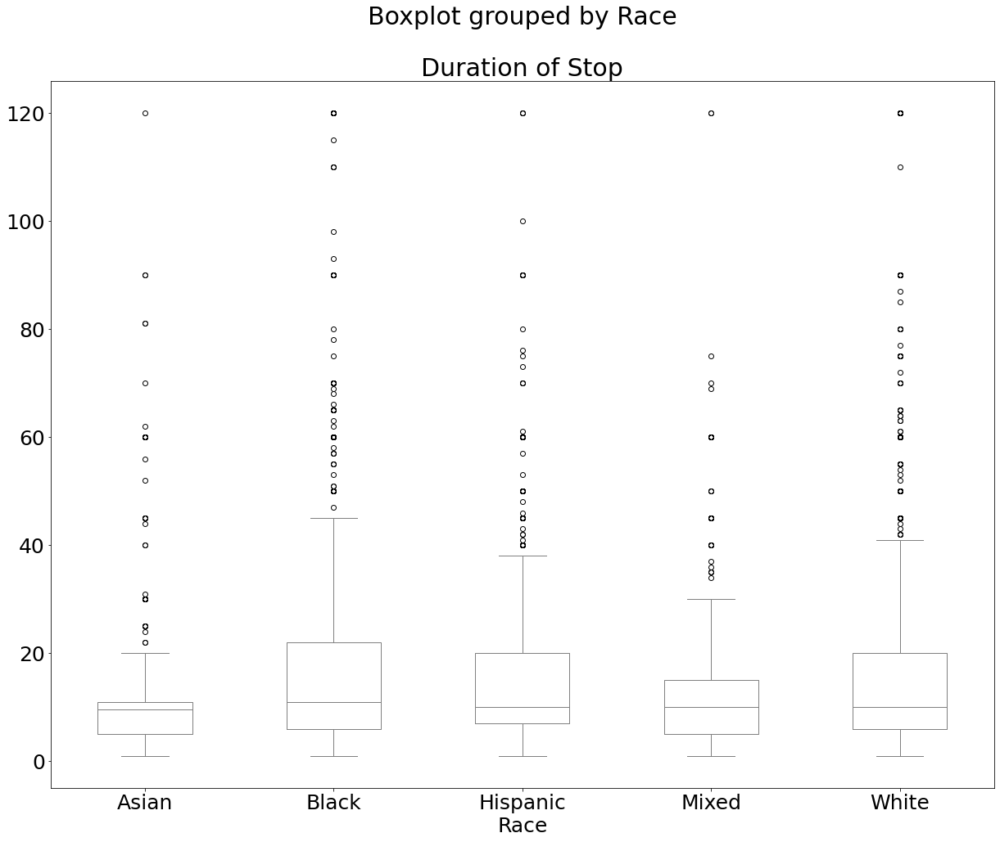

In [52]:
plt.rc('font', size=25)
berk_data.rename(columns={'perceived_race_or_ethnicity':'Race'}, inplace=True)
berk_data_short = berk_data[berk_data['Duration of Stop'] <= 120]
berk_data_short.boxplot(by='Race',column=['Duration of Stop'],grid=False,figsize=(20, 16),color='grey')
plt.savefig('Duration Boxplot by Race (TEXT)')


# Heatmap with GEOJSON

In [9]:
# ir_loc_nan_na = ir_BIG.dropna(subset = ['Latitude', 'Longitude'], inplace=True)

lat = df['lat'].values 
lon = df['v9'].values 

df_locs = np.vstack((lat, lon)).transpose().tolist() 


berk_coords = (37.8715, -122.2730)
berk_map = folium.Map(berk_coords, tiles='cartodbpositron', zoom_start=13.25)
heatmap = HeatMap(df_locs, name='Heatmap', radius = 13) 

# Add it to your Berkeley map.
heatmap.add_to(berk_map)

folium.Choropleth(
    geo_data = geo_json_data2,
    name='Tract Boundaries',
    data = df_grouped_by_tract,
    columns=['censustract', 'Count'],
    line_weight=.25,
    fill_opacity=0,
    opacity=0,
    highlight=True,
).add_to(berk_map)
    
    

# Convert points to GeoJson
folium.features.GeoJson(geo_json_data2,  
                        name='Tract Information',
                        style_function=lambda x: {'color':'transparent','fillColor':'transparent','weight':0},
                        highlight_function = lambda x: {'fillColor': '#000000', 'color':'#000000', 'fillOpacity': 0.10, 'weight': 0.1},
                        tooltip=folium.features.GeoJsonTooltip( fields=['name10','totalpop','numstops','medianincome','whitepop','aapop','na_aipop','aisianpop','hawaiian','mixed2','numschools'],
                                                                aliases = ['Tract Name','Total Population','Number of Stops','Median Income','Number White Residents','Number African American Residents','Number Native American/American Indian Residents','Number Asian American Residents','Number Hawaiian Residents','Number Mixed Residents','Number of Schools'],
                                                                labels=True,
                                                                sticky=False,
                                                                legend=False,
                                                                highlight=True
                                                                            )
                       ).add_to(berk_map)


steps=20
colormap = branca.colormap.linear.YlOrRd_09.scale(0, 1).to_step(steps)
gradient_map=defaultdict(dict)
for i in range(steps):
    gradient_map[1/steps*i] = colormap.rgb_hex_str(1/steps*i)
colormap.add_to(berk_map) #add color bar at the top of the map


folium.LayerControl(collapsed=False).add_to(berk_map)

file_path = r"fullsize_heatmap.html"
berk_map.save(file_path) # Save as html file
# print('debug','saved!')
berk_map

# CIRCLE MAP

In [13]:
# lat = df['LAT'].values 
# lon = df['LONG'].values 

# df_locs = np.vstack((lat, lon)).transpose().tolist() 


berk_coords = (37.8715, -122.2730)
berk_map = folium.Map(berk_coords, tiles='cartodbdark_matter', zoom_start=13.25)
# https://medium.com/datasciencearth/map-visualization-with-folium-d1403771717#:~:text=process%20using%20CircleMaker()
locations = list(zip(df.LAT,df.LONG))

for i in range(len(locations)):
    folium.CircleMarker(location=locations[i],radius=1).add_to(berk_map)

    
    
folium.Choropleth(
    geo_data = geo_json_data2,
    name='Tract Boundaries',
    data = df_grouped_by_tract,
    columns=['Census Tract', 'Count'],
    line_color='white',
    line_weight=.65,
    fill_opacity=0,
    opacity=0,
    highlight=True,
).add_to(berk_map)
    
    

# Convert points to GeoJson
folium.features.GeoJson(geo_json_data2,  
                        name='Tract Information',
                        style_function=lambda x: {'color':'transparent','fillColor':'transparent','weight':0},
                        highlight_function = lambda x: {'fillColor': '#FFFFFF', 'color':'#FFFFFF', 'fillOpacity': 0.6, 'weight': 0.1},
                        tooltip=folium.features.GeoJsonTooltip( fields=['name10','totalpop','numstops','medianincome','whitepop','aapop','na_aipop','aisianpop','hawaiian','mixed2','numschools'],
                                                                aliases = ['Tract Name','Total Population','Number of Stops','Median Income','Number White Residents','Number African American Residents','Number Native American/American Indian Residents','Number Asian American Residents','Number Hawaiian Residents','Number Mixed Residents','Number of Schools'],
                                                                labels=True,
                                                                sticky=False,
                                                                legend=False,
                                                                highlight=True
                                                                            )
                       ).add_to(berk_map)


# https://github.com/python-visualization/folium/pull/242
school_points = pd.read_csv('school points.csv')
feature_group = FeatureGroup(name='School Points')
for i in range(0,len(school_points)):
    institution_type = school_points['schooltype'].iloc[i]
    if institution_type == 'higher education':
        color = 'orange'
        icon='university'
    elif institution_type == 'middle school' or institution_type == 'elementary':
        color = 'lightblue'
        icon='book'
    else:
        color = 'darkblue'
        icon='building'
#         print('debug', color, icon)
        
    label = school_points['name'].iloc[i]

    feature_group.add_child(Marker([school_points['lat'].iloc[i],school_points['lon'].iloc[i]],
                                    popup=label, icon=folium.Icon(color=color, icon=icon,name='Schools', prefix='fa')))


berk_map.add_child(feature_group)
# berk_map.add_child(folium.map.LayerControl())     
# folium.LayerControl(collapsed=False).add_to(berk_map)


# Add dark and light mode. 
folium.TileLayer('cartodbpositron',name="Light Mode",control=True).add_to(berk_map)
folium.TileLayer('openstreetmap',name="Street Map",control=True).add_to(berk_map)

folium.LayerControl(collapsed=False).add_to(berk_map)

file_path = r"circlemap.html"
berk_map.save(file_path) # Save as html file
print('debug','saved!')
berk_map

debug saved!
